In [2]:
import itertools
import numpy as np
import pandas as pd 
from numbers import Number
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import sklearn 
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_validate
import statsmodels
from statsmodels.formula.api import ols

import sqlite3 
import json
import folium 
import folium.plugins as plugins
import branca.colormap as cm

%matplotlib inline

import pickle

In [3]:
def clean_df(df, 
            bedrooms_min=3, 
            bedrooms_max=4, 
            condition_min = 1, 
            condition_max = 4, 
            grade_min = 5, 
            grade_max = 11, 
            house_age_min = 0, 
            house_age_max = 300, 
            price_min = 0, 
            price_max = 7700000):
    """
    Cleans the dataframe with specified conditions.

    df - dataframe that will be altered
    bedrooms_min - Minimum bedrooms, set to 3 as default
    bedrooms_max - Maximum bedrooms, set to 4 as default
    condition_min - Minimum condition of a home, set to 1 (Fair) by default
    condition_max - Maximum condition of a home, set to 4 (Very Good) by default
    grade_min - Minimum grade for a home, set to 5 (Fair) by default
    grade_max - Maximum grade for a home, set to 11 (Excellent) by default
    house_age_min - Minimum age for a home, set to 0 by default
    house_age_max - Maximum age for a home, set to 300 by default 
    price_min - Minimum price for a home, set to 0 by default 
    price_max - Maximum price for a home, set to 7700000 by default
    
    """

    # Creating a copy of df and creating for future data shaping.
    df_copy = df.copy()
    drop_columns = ['waterfront', 'view', 'sqft_basement','sqft_lot','sqft_lot15']
    condition_dict = {'Poor':0, 'Fair':1, 'Average':2, 'Good':3, 'Very Good':4}

    # Dropping unnecessary columns and removing a 
    df_copy.drop(drop_columns, axis= 1, inplace=True)
    df_copy = df_copy[df_copy['bedrooms']!=33]
    
    df_copy['date'] = pd.to_datetime(df_copy["date"])
    
    df_copy['grade_value'] = df_copy['grade'].map(lambda x: x[:2])
    df_copy['grade_value'] = df_copy['grade_value'].astype(int)

    df_copy['age'] = df_copy['yr_built']
    df_copy.loc[df_copy['yr_renovated'] != 0, 'age'] = df_copy['yr_renovated']
    df_copy['age'] = df_copy['age'].map(lambda x: 2015-x)

    df_copy['condition_num'] = df_copy['condition'].map(condition_dict)

    df_copy = df_copy[df_copy['bedrooms'] >= bedrooms_min]
    df_copy = df_copy[df_copy['bedrooms'] <= bedrooms_max]

    df_copy = df_copy[df_copy['condition_num'] >= condition_min]
    df_copy = df_copy[df_copy['condition_num'] <= condition_max]

    df_copy = df_copy[df_copy['grade_value'] >= grade_min]
    df_copy = df_copy[df_copy['grade_value'] <= grade_max]

    df_copy = df_copy[df_copy['age'] >= house_age_min]
    df_copy = df_copy[df_copy['age'] <= house_age_max]

    df_copy = df_copy[df_copy['price'] >= price_min]
    df_copy = df_copy[df_copy['price'] <= price_max]

    df_clean = df_copy.copy()

    return(df_clean)

def map_feature_by_zipcode(zipcode_data, col):
    """
    Generates a folium map of Seattle
    :param zipcode_data: zipcode dataset
    :param col: feature to display
    :return: m
    """

    # read updated geo data
    king_geo = "cleaned_geodata.json"

    # Initialize Folium Map with Seattle latitude and longitude
    m = folium.Map(location=[47.35, -121.9], zoom_start=9.25,
                   detect_retina=True, control_scale=False, tiles='OpenStreetMap')

    # Create choropleth map
    m.choropleth(
        geo_data=king_geo,
        name='choropleth',
        data=zipcode_data,
        # col: feature of interest
        columns=['zipcode', col],
        key_on='feature.properties.ZIPCODE',
        fill_color='YlGnBu',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name='house ' + col
    )
    folium.LayerControl().add_to(m)

    # Save map based on feature of interest
    m.save(col + '.html')

    return m

In [4]:
df = pd.read_csv('./data/kc_house_data.csv')

In [5]:
df = clean_df(df)

In [6]:
df.duplicated(subset='id').sum()

81

In [7]:
df = df.drop_duplicates(subset="id",keep="last")

In [8]:
df

,id,date,price,bedrooms,bathrooms,sqft_living,floors,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,grade_value,age,condition_num
0,7129300520,2014-10-13,221900.0,3,1.00,1180,1.0,Average,7 Average,1180,1955,0.0,98178,47.5112,-122.257,1340,7,60.0,2
1,6414100192,2014-12-09,538000.0,3,2.25,2570,2.0,Average,7 Average,2170,1951,1991.0,98125,47.7210,-122.319,1690,7,24.0,2
3,2487200875,2014-12-09,604000.0,4,3.00,1960,1.0,Very Good,7 Average,1050,1965,0.0,98136,47.5208,-122.393,1360,7,50.0,4
4,1954400510,2015-02-18,510000.0,3,2.00,1680,1.0,Average,8 Good,1680,1987,0.0,98074,47.6168,-122.045,1800,8,28.0,2
5,7237550310,2014-05-12,1230000.0,4,4.50,5420,1.0,Average,11 Excellent,3890,2001,0.0,98053,47.6561,-122.005,4760,11,14.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21590,7936000429,2015-03-26,1010000.0,4,3.50,3510,2.0,Average,9 Better,2600,2009,0.0,98136,47.5537,-122.398,2050,9,6.0,2
21591,2997800021,2015-02-19,475000.0,3,2.50,1310,2.0,Average,8 Good,1180,2008,0.0,98116,47.5773,-122.409,1330,8,7.0,2
21592,263000018,2014-05-21,360000.0,3,2.50,1530,3.0,Average,8 Good,1530,2009,0.0,98103,47.6993,-122.346,1530,8,6.0,2
21593,6600060120,2015-02-23,400000.0,4,2.50,2310,2.0,Average,8 Good,2310,2014,0.0,98146,47.5107,-122.362,1830,8,1.0,2


In [58]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'floors',
       'condition', 'grade', 'sqft_above', 'yr_built', 'yr_renovated',
       'zipcode', 'lat', 'long', 'sqft_living15', 'grade_value', 'age',
       'condition_num'],
      dtype='object')

In [204]:
variables = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_living15', 'floors', 'sqft_above', 'lat', 'long', 'grade_value', 'age', 'zipcode', 'condition_num']
price_var = ['price'] + variables

In [28]:
logged_price = np.log(df["price"])
logged_price

0        12.309982
1        13.195614
3        13.311329
4        13.142166
5        14.022525
           ...    
21590    13.825461
21591    13.071070
21592    12.793859
21593    12.899220
21595    12.899220
Name: price, Length: 13598, dtype: float64

In [29]:
df

,id,date,price,bedrooms,bathrooms,sqft_living,floors,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,grade_value,age,condition_num
0,7129300520,2014-10-13,221900.0,3,1.00,1180,1.0,Average,7 Average,1180,1955,0.0,98178,47.5112,-122.257,1340,7,60.0,2
1,6414100192,2014-12-09,538000.0,3,2.25,2570,2.0,Average,7 Average,2170,1951,1991.0,98125,47.7210,-122.319,1690,7,24.0,2
3,2487200875,2014-12-09,604000.0,4,3.00,1960,1.0,Very Good,7 Average,1050,1965,0.0,98136,47.5208,-122.393,1360,7,50.0,4
4,1954400510,2015-02-18,510000.0,3,2.00,1680,1.0,Average,8 Good,1680,1987,0.0,98074,47.6168,-122.045,1800,8,28.0,2
5,7237550310,2014-05-12,1230000.0,4,4.50,5420,1.0,Average,11 Excellent,3890,2001,0.0,98053,47.6561,-122.005,4760,11,14.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21590,7936000429,2015-03-26,1010000.0,4,3.50,3510,2.0,Average,9 Better,2600,2009,0.0,98136,47.5537,-122.398,2050,9,6.0,2
21591,2997800021,2015-02-19,475000.0,3,2.50,1310,2.0,Average,8 Good,1180,2008,0.0,98116,47.5773,-122.409,1330,8,7.0,2
21592,263000018,2014-05-21,360000.0,3,2.50,1530,3.0,Average,8 Good,1530,2009,0.0,98103,47.6993,-122.346,1530,8,6.0,2
21593,6600060120,2015-02-23,400000.0,4,2.50,2310,2.0,Average,8 Good,2310,2014,0.0,98146,47.5107,-122.362,1830,8,1.0,2


In [30]:
df.corr()['price'].sort_values()

age             -0.061266
id              -0.024528
long            -0.002953
yr_built         0.000398
zipcode          0.010370
condition_num    0.035408
yr_renovated     0.144023
floors           0.242161
bedrooms         0.249497
lat              0.364987
bathrooms        0.475054
sqft_above       0.547248
sqft_living15    0.569757
grade_value      0.649302
sqft_living      0.667802
price            1.000000
Name: price, dtype: float64

In [127]:
y = logged_price
x = df[variables]
X = sm.add_constant(x)
model = sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.736
Model:                            OLS   Adj. R-squared:                  0.736
Method:                 Least Squares   F-statistic:                     3444.
Date:                Thu, 06 Jan 2022   Prob (F-statistic):               0.00
Time:                        11:47:02   Log-Likelihood:                -681.94
No. Observations:               13598   AIC:                             1388.
Df Residuals:                   13586   BIC:                             1478.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           -66.1322      2.314    -28.575      0.000     -70.669     -61.596
bedrooms         -0.0238      0.005     -4.715      0.000      -0.034      -0.014
bathrooms         0.0725      0.005     13.477      0.000       0.062       0.083
sqft_living       0.0002   7.19e-06     30.357      0.000       0.000       0.000
sqft_living15     0.0001    5.7e-06     18.342      0.000    9.33e-05       0.000
floors            0.0635      0.006     11.017      0.000       0.052       0.075
sqft_above    -4.888e-05   7.16e-06     -6.826      0.000   -6.29e-05   -3.48e-05
lat               1.3244      0.016     82.581      0.000       1.293       1.356
long             -0.1146      0.018     -6.333      0.000      -0.150      -0.079
grade_value       0.1522      0.004     42.628      0.000       0.145       0.159
age               0.0029      0.000     24.478      0.000       0.003       0.003
condition_num     0.0675      0.004     17.366      0.000       0.060       0.075
==============================================================================
Omnibus:                      408.553   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              607.956
Skew:                           0.307   Prob(JB):                    9.64e-133
Kurtosis:                       3.834   Cond. No.                     3.86e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.86e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [131]:
drop_model = model.params.index

Index(['const', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_living15',
       'floors', 'sqft_above', 'lat', 'long', 'grade_value', 'age',
       'condition_num'],
      dtype='object')

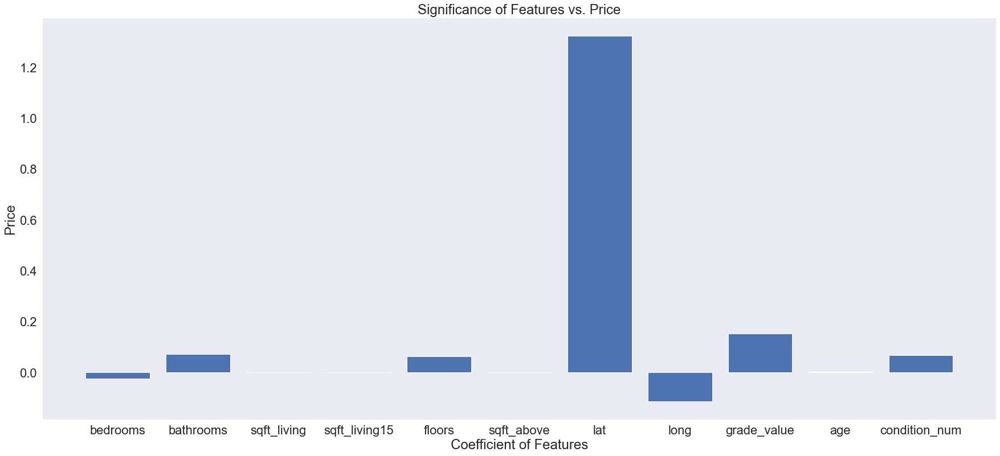

In [129]:
fig, ax= plt.subplots(figsize=(30,13))

sns.set(font_scale=2)
ax.bar(model.params.index[1:], model.params.values[1:])
ax.set_title("Significance of Features vs. Price")
ax.set_xlabel("Coefficient of Features")
ax.set_ylabel("Price")
ax.grid(False);

In [32]:
my_sample = df.sample(1)
my_sample_price = my_sample.iloc[0,2]
my_sample_pt = my_sample[variables]

# Show my random sample off
print(f'Price of sample: ${my_sample_price}')
my_sample_pt

Price of sample: $915000.0


,bedrooms,bathrooms,sqft_living,sqft_living15,floors,sqft_above,lat,long,grade_value,age,condition_num
16148,3,1.0,1560,1930,1.0,1560,47.623,-122.205,7,63.0,2


In [33]:
def train_lr_randomly(data, sample_pt=None, ntimes=100):
    '''
    Takes in features & targets from `data` to train a linear regression with a
    random sample `ntimes`. It then returns a list of R2 scores, RMSEs, and the 
    predictions from a provided data point of features `sample_pt`.
    '''
    # To save all of our predictions
    r2 = []
    rmse = []
    # Only return predictions if there is something to predict (sample_pt given)
    point_preds = [] if (sample_pt is not None) else None

    # We'll repeat this little experiment to see how the model does
    for i in range(ntimes):
        # Creating a random sample of data to train on
        df_sample = data.sample(5000, replace=True)
        y = df_sample.price
        X = df_sample.drop('price', axis=1)

        # Our linear regression model about to be trained
        lr = LinearRegression()
        lr.fit(X, y)

        # Making predictions & evaluating on the data we used to train the model
        y_hat = lr.predict(X)
        rmse.append(np.sqrt(mean_squared_error(y, y_hat)))
        r2.append(lr.score(X, y))

        # Making a prediction on the one point the model definitely never saw
        if sample_pt is not None:
            y_hat_pt = lr.predict(sample_pt)
            # Getting just the single point to add into list
            point_preds.append(y_hat_pt[0])
    
    return r2, rmse, point_preds

In [34]:
r2_simple, rmse_simple, pt_preds_simple = train_lr_randomly(
                                                        data=df[price_var], 
                                                        sample_pt=my_sample_pt,
                                                        ntimes=100                            
)

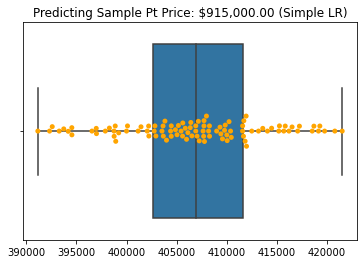

In [35]:
ax = sns.boxplot(x=pt_preds_simple);
ax = sns.swarmplot(x=pt_preds_simple, color='orange', ax=ax)
ax.set_title(f'Predicting Sample Pt Price: ${my_sample_price:,.2f} (Simple LR)');

In [36]:
df_pol = df[variables]

In [37]:
pf = PolynomialFeatures(2)

df_poly = pd.DataFrame(pf.fit_transform(df_pol))
df_poly.index = df_pol.index
df_poly['price'] = df['price']

cols = list(df_poly)

# move the column to head of list using index, pop and insert
cols.insert(0, cols.pop(cols.index('price')))

df_poly = df_poly.loc[:, cols]

df_poly.head(10)

,price,0,1,2,3,4,5,6,7,8,...,68,69,70,71,72,73,74,75,76,77
0,221900.0,1.0,3.0,1.00,1180.0,1340.0,1.0,1180.0,47.5112,-122.257,...,14946.774049,-855.799,-7335.420,-244.514,49.0,420.0,14.0,3600.0,120.0,4.0
1,538000.0,1.0,3.0,2.25,2570.0,1690.0,2.0,2170.0,47.7210,-122.319,...,14961.937761,-856.233,-2935.656,-244.638,49.0,168.0,14.0,576.0,48.0,4.0
3,604000.0,1.0,4.0,3.00,1960.0,1360.0,1.0,1050.0,47.5208,-122.393,...,14980.046449,-856.751,-6119.650,-489.572,49.0,350.0,28.0,2500.0,200.0,16.0
4,510000.0,1.0,3.0,2.00,1680.0,1800.0,1.0,1680.0,47.6168,-122.045,...,14894.982025,-976.360,-3417.260,-244.090,64.0,224.0,16.0,784.0,56.0,4.0
5,1230000.0,1.0,4.0,4.50,5420.0,4760.0,1.0,3890.0,47.6561,-122.005,...,14885.220025,-1342.055,-1708.070,-244.010,121.0,154.0,22.0,196.0,28.0,4.0
6,257500.0,1.0,3.0,2.25,1715.0,2238.0,2.0,1715.0,47.3097,-122.327,...,14963.894929,-856.289,-2446.540,-244.654,49.0,140.0,14.0,400.0,40.0,4.0
7,291850.0,1.0,3.0,1.50,1060.0,1650.0,1.0,1060.0,47.4095,-122.315,...,14960.959225,-856.205,-6360.380,-244.630,49.0,364.0,14.0,2704.0,104.0,4.0
8,229500.0,1.0,3.0,1.00,1780.0,1780.0,1.0,1050.0,47.5123,-122.337,...,14966.341569,-856.359,-6728.535,-244.674,49.0,385.0,14.0,3025.0,110.0,4.0
9,323000.0,1.0,3.0,2.50,1890.0,2390.0,2.0,1890.0,47.3684,-122.031,...,14891.564961,-854.217,-1464.372,-244.062,49.0,84.0,14.0,144.0,24.0,4.0
10,662500.0,1.0,3.0,2.50,3560.0,2210.0,1.0,1860.0,47.6007,-122.145,...,14919.401025,-977.160,-6107.250,-244.290,64.0,400.0,16.0,2500.0,100.0,4.0


In [38]:
# Let's make sure we have another sample point to test our models
my_sample_pt_poly = pf.transform(my_sample_pt)

# Show my random sample off
print(f'Price of sample: ${my_sample_price}')
my_sample_pt_poly.shape

Price of sample: $915000.0


(1, 78)

In [39]:
# Run 100 linear regression trainings on some random polynomial features data
# from df_poly and compare it with the random sample point
r2_poly, rmse_poly, pt_preds_poly = train_lr_randomly(
                                                data=df_poly, 
                                                sample_pt=my_sample_pt_poly,
                                                ntimes=100 
)

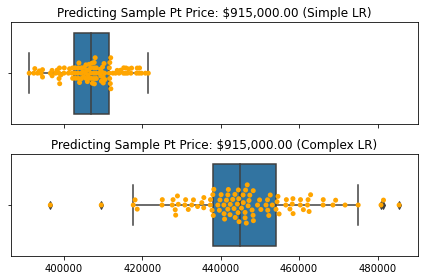

In [40]:
f, (ax1,ax2) = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(6,4));

# Simple model
ax = sns.boxplot(x=pt_preds_simple, ax=ax1);
ax = sns.swarmplot(x=pt_preds_simple, color='orange', ax=ax)
ax.set_title(f'Predicting Sample Pt Price: ${my_sample_price:,.2f} (Simple LR)');

# Complex model
ax = sns.boxplot(x=pt_preds_poly, ax=ax2);
ax = sns.swarmplot(x=pt_preds_poly, color='orange', ax=ax)
ax.set_title(f'Predicting Sample Pt Price: ${my_sample_price:,.2f} (Complex LR)');

# Makes spacing work better
f.tight_layout()

In [41]:
print('How it did on its own training data:')
print(f'\t- simple mean {np.mean(rmse_simple)}')
print(f'\t- complex mean {np.mean(rmse_poly)}')
print('\n')

print('How it did on data it never saw:')
print(f'\t- simple variance {np.std(pt_preds_simple)}')
print(f'\t- complex variance {np.std(pt_preds_poly)}')

How it did on its own training data:
	- simple mean 191174.8733257606
	- complex mean 158947.9778724713


How it did on data it never saw:
	- simple variance 7046.098315029387
	- complex variance 14706.451342758408


In [42]:
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y,
                                                    test_size=None,
                                                    random_state=42)

In [43]:
display(X_train.head())
display(X_test.head())

,const,bedrooms,bathrooms,sqft_living,sqft_living15,floors,sqft_above,lat,long,grade_value,age,condition_num
9965,1.0,4,2.50,2420,2280,2.0,2420,47.6874,-122.037,7,14.0,2
19024,1.0,3,1.75,2330,2420,1.0,1590,47.5714,-122.211,8,47.0,3
10790,1.0,4,2.50,2620,2760,2.0,2620,47.4357,-122.159,9,24.0,2
20539,1.0,4,2.50,2560,2586,2.0,2560,47.3404,-122.181,8,2.0,2
17544,1.0,3,3.25,5480,2500,2.0,5480,47.4558,-122.371,11,24.0,2


,const,bedrooms,bathrooms,sqft_living,sqft_living15,floors,sqft_above,lat,long,grade_value,age,condition_num
5592,1.0,4,2.50,2540,3640,2.0,2540,47.7034,-122.236,9,16.0,2
19104,1.0,4,2.50,2810,2990,2.0,2810,47.5303,-122.143,9,22.0,3
257,1.0,3,1.75,1580,1550,1.0,1200,47.4756,-122.147,7,41.0,3
155,1.0,3,1.00,1180,1190,1.0,1180,47.4479,-122.176,7,48.0,3
10309,1.0,4,1.00,1760,1180,1.0,1230,47.4288,-122.198,7,49.0,2


In [44]:
print(X_train.shape)
print(X_test.shape)

print(X_train.shape[0] == y_train.shape[0])
print(X_test.shape[0] == y_test.shape[0])

(10198, 12)
(3400, 12)
True
True


In [45]:
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [46]:
lr.predict(X_train)

array([13.11119795, 13.23104155, 13.20601173, ..., 13.1279344 ,
       12.99376328, 13.77086704])

In [47]:
lr.score(X_train, y_train)

0.7347534740903074

In [48]:
rmse_total = (sum((y_test - lr.predict(X_test))**2)/len(y_test))**.5
rmse_total

0.25173964129315046

In [49]:
lr.score(X_test, y_test)

0.7393633930996406

In [63]:
lr.predict(X_test)

array([13.62585569, 13.44967571, 12.69202316, ..., 12.26043076,
       12.50242592, 13.00890428])

In [65]:
y_test

5592     13.353475
19104    13.524490
257      12.660328
155      12.278393
10309    12.807653
           ...    
19099    13.422468
13525    12.644328
10691    12.310433
5516     12.574182
20103    12.896717
Name: price, Length: 3400, dtype: float64

In [55]:
test_prediction = lr.predict(X_test)

In [50]:
((y_test-lr.predict(X_test))**2).sort_values(ascending=False).cumsum()/sum(((y_test-lr.predict(X_test))**2).sort_values(ascending=False))

326      0.007343
6237     0.013204
656      0.018810
6817     0.023741
11266    0.028357
           ...   
18109    1.000000
18375    1.000000
5310     1.000000
6838     1.000000
17473    1.000000
Name: price, Length: 3400, dtype: float64

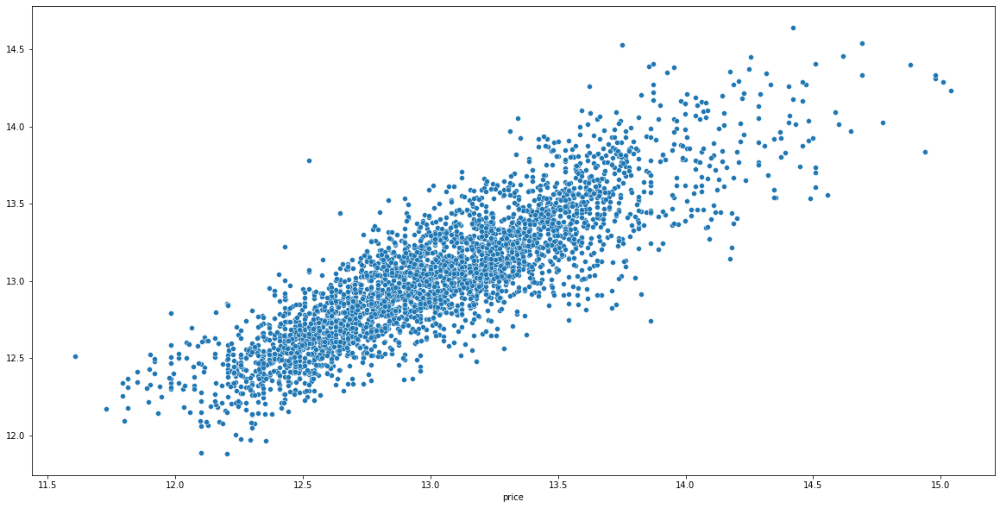

In [66]:
f, ax = plt.subplots(figsize=(20, 10)) 
sns.scatterplot(x=y_test, y=test_prediction)
plt.show()

In [125]:
y = logged_price
x = df[variables]
X = sm.add_constant(x)
model = sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.602
Model:                            OLS   Adj. R-squared:                  0.602
Method:                 Least Squares   F-statistic:                     2285.
Date:                Thu, 06 Jan 2022   Prob (F-statistic):               0.00
Time:                        11:45:21   Log-Likelihood:                -3471.9
No. Observations:               13598   AIC:                             6964.
Df Residuals:                   13588   BIC:                             7039.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            10.4285      0.034    305.762      0.000      10.362      10.495
bedrooms         -0.0317      0.006     -5.109      0.000      -0.044      -0.020
bathrooms         0.0801      0.007     12.132      0.000       0.067       0.093
sqft_living       0.0003   8.72e-06     30.181      0.000       0.000       0.000
sqft_living15     0.0001   6.84e-06     14.839      0.000    8.81e-05       0.000
floors            0.1282      0.007     18.469      0.000       0.115       0.142
sqft_above       -0.0001   8.44e-06    -16.079      0.000      -0.000      -0.000
grade_value       0.1999      0.004     46.728      0.000       0.192       0.208
age               0.0053      0.000     38.894      0.000       0.005       0.006
condition_num     0.0416      0.005      8.764      0.000       0.032       0.051
==============================================================================
Omnibus:                       39.359   Durbin-Watson:                   1.973
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               41.966
Skew:                           0.103   Prob(JB):                     7.71e-10
Kurtosis:                       3.178   Cond. No.                     4.67e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.67e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [96]:
df2 = np.log(df)

TypeError: loop of ufunc does not support argument 0 of type int which has no callable log method

In [210]:
logdf = np.log(df[price_var])
logdf

<ipython-input-210-b1399fe9ce2b>:1: RuntimeWarning: divide by zero encountered in log
  logdf = np.log(df[price_var])
<ipython-input-210-b1399fe9ce2b>:1: RuntimeWarning: invalid value encountered in log
  logdf = np.log(df[price_var])


,price,bedrooms,bathrooms,sqft_living,sqft_living15,floors,sqft_above,lat,long,grade_value,age,zipcode,condition_num
0,12.309982,1.098612,0.000000,7.073270,7.200425,0.000000,7.073270,3.860965,NaN,1.945910,4.094345,11.494537,0.693147
1,13.195614,1.098612,0.810930,7.851661,7.432484,0.693147,7.682482,3.865372,NaN,1.945910,3.178054,11.493997,0.693147
3,13.311329,1.386294,1.098612,7.580700,7.215240,0.000000,6.956545,3.861168,NaN,1.945910,3.912023,11.494110,1.386294
4,13.142166,1.098612,0.693147,7.426549,7.495542,0.000000,7.426549,3.863186,NaN,2.079442,3.332205,11.493478,0.693147
5,14.022525,1.386294,1.504077,8.597851,8.468003,0.000000,8.266164,3.864011,NaN,2.397895,2.639057,11.493263,0.693147
...,...,...,...,...,...,...,...,...,...,...,...,...,...
21590,13.825461,1.386294,1.252763,8.163371,7.625595,0.693147,7.863267,3.861860,NaN,2.197225,1.791759,11.494110,0.693147
21591,13.071070,1.098612,0.916291,7.177782,7.192934,0.693147,7.073270,3.862356,NaN,2.079442,1.945910,11.493906,0.693147
21592,12.793859,1.098612,0.916291,7.333023,7.333023,1.098612,7.333023,3.864917,NaN,2.079442,1.791759,11.493773,0.693147
21593,12.899220,1.386294,0.916291,7.745003,7.512071,0.693147,7.745003,3.860955,NaN,2.079442,0.000000,11.494211,0.693147


In [211]:
np.log(df[price_var])

<ipython-input-211-0c80a1fd5a59>:1: RuntimeWarning: divide by zero encountered in log
  np.log(df[price_var])
<ipython-input-211-0c80a1fd5a59>:1: RuntimeWarning: invalid value encountered in log
  np.log(df[price_var])


,price,bedrooms,bathrooms,sqft_living,sqft_living15,floors,sqft_above,lat,long,grade_value,age,zipcode,condition_num
0,12.309982,1.098612,0.000000,7.073270,7.200425,0.000000,7.073270,3.860965,NaN,1.945910,4.094345,11.494537,0.693147
1,13.195614,1.098612,0.810930,7.851661,7.432484,0.693147,7.682482,3.865372,NaN,1.945910,3.178054,11.493997,0.693147
3,13.311329,1.386294,1.098612,7.580700,7.215240,0.000000,6.956545,3.861168,NaN,1.945910,3.912023,11.494110,1.386294
4,13.142166,1.098612,0.693147,7.426549,7.495542,0.000000,7.426549,3.863186,NaN,2.079442,3.332205,11.493478,0.693147
5,14.022525,1.386294,1.504077,8.597851,8.468003,0.000000,8.266164,3.864011,NaN,2.397895,2.639057,11.493263,0.693147
...,...,...,...,...,...,...,...,...,...,...,...,...,...
21590,13.825461,1.386294,1.252763,8.163371,7.625595,0.693147,7.863267,3.861860,NaN,2.197225,1.791759,11.494110,0.693147
21591,13.071070,1.098612,0.916291,7.177782,7.192934,0.693147,7.073270,3.862356,NaN,2.079442,1.945910,11.493906,0.693147
21592,12.793859,1.098612,0.916291,7.333023,7.333023,1.098612,7.333023,3.864917,NaN,2.079442,1.791759,11.493773,0.693147
21593,12.899220,1.386294,0.916291,7.745003,7.512071,0.693147,7.745003,3.860955,NaN,2.079442,0.000000,11.494211,0.693147


In [103]:
logdf = logdf.drop(['lat', 'long'], axis=1)

In [208]:
variables

['bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_living15',
 'floors',
 'sqft_above',
 'lat',
 'grade_value',
 'zipcode',
 'condition_num']

In [149]:
logvar = variables

In [206]:
logvar = variables.remove('long')

In [207]:
logvar = variables.remove('age')

In [138]:
logvar

In [123]:
logdf[['bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_living15',
 'floors',
 'sqft_above',
 'grade_value',
 'age',
    
 'condition_num']]

,bedrooms,bathrooms,sqft_living,sqft_living15,floors,sqft_above,grade_value,age,condition_num
0,1.098612,0.000000,7.073270,7.200425,0.000000,7.073270,1.945910,4.094345,0.693147
1,1.098612,0.810930,7.851661,7.432484,0.693147,7.682482,1.945910,3.178054,0.693147
3,1.386294,1.098612,7.580700,7.215240,0.000000,6.956545,1.945910,3.912023,1.386294
4,1.098612,0.693147,7.426549,7.495542,0.000000,7.426549,2.079442,3.332205,0.693147
5,1.386294,1.504077,8.597851,8.468003,0.000000,8.266164,2.397895,2.639057,0.693147
...,...,...,...,...,...,...,...,...,...
21590,1.386294,1.252763,8.163371,7.625595,0.693147,7.863267,2.197225,1.791759,0.693147
21591,1.098612,0.916291,7.177782,7.192934,0.693147,7.073270,2.079442,1.945910,0.693147
21592,1.098612,0.916291,7.333023,7.333023,1.098612,7.333023,2.079442,1.791759,0.693147
21593,1.386294,0.916291,7.745003,7.512071,0.693147,7.745003,2.079442,0.000000,0.693147


In [212]:
y = logdf['price']
x = logdf[variables]
X = sm.add_constant(x)
model = sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.713
Model:                            OLS   Adj. R-squared:                  0.713
Method:                 Least Squares   F-statistic:                     3371.
Date:                Thu, 06 Jan 2022   Prob (F-statistic):               0.00
Time:                        13:32:04   Log-Likelihood:                -1256.8
No. Observations:               13598   AIC:                             2536.
Df Residuals:                   13587   BIC:                             2618.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          -541.2550     53.223    -10.170      0.000    -645.579    -436.931
bedrooms         -0.0646      0.018     -3.499      0.000      -0.101      -0.028
bathrooms        -0.0206      0.010     -2.044      0.041      -0.040      -0.001
sqft_living       0.5252      0.016     33.766      0.000       0.495       0.556
sqft_living15     0.1909      0.012     15.736      0.000       0.167       0.215
floors            0.0613      0.009      6.606      0.000       0.043       0.079
sqft_above       -0.0785      0.014     -5.745      0.000      -0.105      -0.052
lat              67.2236      0.804     83.642      0.000      65.648      68.799
grade_value       1.1930      0.028     42.968      0.000       1.139       1.247
zipcode          24.9935      4.693      5.326      0.000      15.795      34.192
condition_num     0.2775      0.010     28.182      0.000       0.258       0.297
==============================================================================
Omnibus:                      705.163   Durbin-Watson:                   1.982
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1015.112
Skew:                           0.474   Prob(JB):                    3.73e-221
Kurtosis:                       3.945   Cond. No.                     4.23e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.23e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [213]:
model.params.index

Index(['const', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_living15',
       'floors', 'sqft_above', 'lat', 'grade_value', 'zipcode',
       'condition_num'],
      dtype='object')

In [214]:
model.params.values

array([-5.41254981e+02, -6.46200265e-02, -2.06333485e-02,  5.25214420e-01,
        1.90884997e-01,  6.12517245e-02, -7.84691064e-02,  6.72235978e+01,
        1.19302473e+00,  2.49935068e+01,  2.77514310e-01])

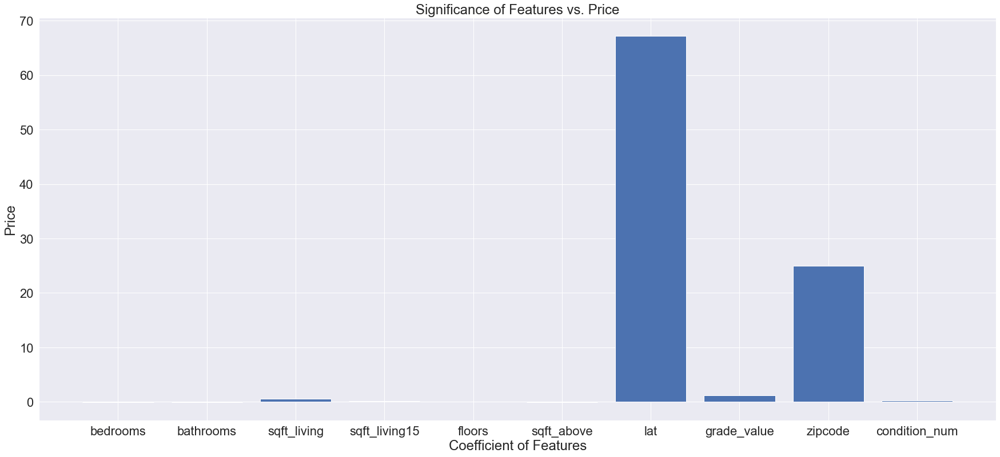

In [215]:
fig, ax= plt.subplots(figsize=(30,13))

sns.set(font_scale=2)
ax.bar(model.params.index[1:], model.params.values[1:])
ax.set_title("Significance of Features vs. Price")
ax.set_xlabel("Coefficient of Features")
ax.set_ylabel("Price");

In [ ]:
model.p

In [182]:
def price_calculator_partial(sqft_living, grade_value, bedrooms, bathrooms, floors, condition_num, age, sqft_living15, sqft_above, lat, long, data=df):
    y = np.log(data["price"])
    x = data[['sqft_living', 'grade_value', 'bedrooms', 'bathrooms', 'floors', 'condition_num', 'age', 'sqft_living15', 'sqft_above', 'lat', 'long']]
    X = sm.add_constant(x)
    model = sm.OLS(y,X).fit()
    coef = model.params
    price = coef['const'] + sqft_living*coef['sqft_living'] + grade_value*coef['grade_value'] + sqft_above*coef['sqft_above'] + bedrooms*coef['bedrooms'] + bathrooms*coef['bathrooms'] + floors*coef['floors'] + lat*coef['lat'] + long*coef['long'] + sqft_living15*coef['sqft_living15'] + condition_num*coef['condition_num'] + age*coef['age']
    price = int(round(price, 2))
    #print(f'For given specifications expected price range for a house would be USD {price-50000} - {price+50000}. ')
    return price

In [183]:
def price_calculator_zipcode(zipcode, data=df):
    sqft_living = int(input('How many SQFT is the house?'))
    grade_value = int(input('What grade is the house? From 1-Fair to 7-Excellent'))+4
    bedrooms = int(input('How many bedrooms does the house have?'))
    bathrooms = float(input('How many bathrooms does the house have?'))
    floors = int(input('How many floors does the house have?'))
    condition_num = int(input('What condition is the house in? 1-Fair to 4-Very Good'))
    age = int(input('How many years passed after last renovation? If never renovated put age of the house. '))
    sqft_above = 1180
    sqft_living15 = 1340
    lat = 47.51
    long = -122.26

    data_zipcode = data[data['zipcode']==zipcode]
    price_area = price_calculator_partial(sqft_above,sqft_living,grade_value,bedrooms,bathrooms,floors,condition_num,age,sqft_living15, lat, long, data)
    price_zipcode = price_calculator_partial(sqft_above,sqft_living,grade_value,bedrooms,bathrooms,floors,condition_num,age,sqft_living15, lat, long, data_zipcode)
    if price_zipcode > (730000/1.1):
        print(f'This zipcode is too expensive for given specifications, expected price is {price_zipcode}')
    else:
        print(f'For given specifications expected price range for a house in {zipcode} zipcode would be  ${int(price_zipcode-price_zipcode*.25)} - {int(price_zipcode+price_zipcode*.25)}. ')
        print(f'For given specifications expected price range for a house in King County would be ${int(price_area-price_area*.25)} - {int(price_area+price_area*.25)}. ')
        if price_area < price_zipcode:
            print(f'This zipcode is overpriced with average ${price_zipcode} compared to King County market  average of ${price_area}')
        elif price_area > price_zipcode:
            print(f'This zipcode is underpriced with average ${price_zipcode} compared to King County market  average of ${price_area}')
        else:
            print('This zipcode is similar with average ${price_zipcode} compared to King County market.')
        return price_zipcode-price_zipcode*.25, price_zipcode+price_zipcode*.25

In [184]:
price_calculator_zipcode(98178)

How many SQFT is the house?1180
What grade is the house? From 1-Fair to 7-Excellent3
How many bedrooms does the house have?3
How many bathrooms does the house have?1
How many floors does the house have?1
What condition is the house in? 1-Fair to 4-Very Good3
How many years passed after last renovation? If never renovated put age of the house. 15
For given specifications expected price range for a house in 98178 zipcode would be  $36 - 60. 
For given specifications expected price range for a house in King County would be $142 - 237. 
This zipcode is underpriced with average $48 compared to King County market  average of $190


(36.0, 60.0)

C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


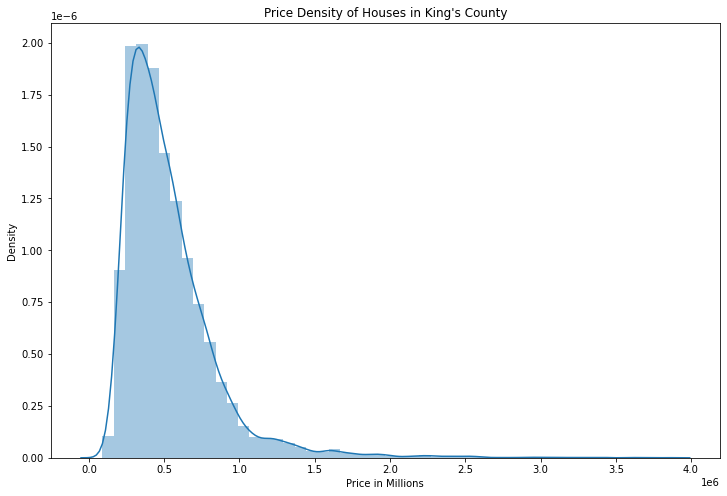

In [103]:
plt.figure(figsize=(12,8))

price_dist = sns.distplot(df["price"])
price_dist.set(xlabel="Price in Millions", title="Price Density of Houses in King's County")
plt.show()

In [14]:
logged_price = np.log(df["price"])

C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


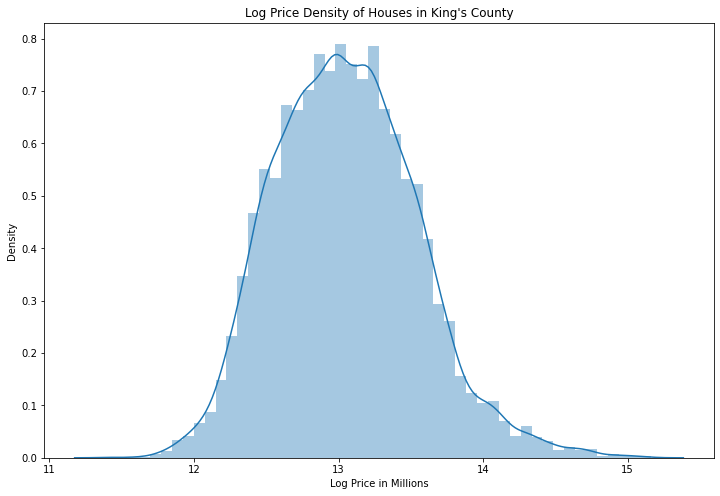

In [104]:
plt.figure(figsize=(12,8))

logged_price_dist = sns.distplot(np.log(df["price"]))
logged_price_dist.set(xlabel="Log Price in Millions", title="Log Price Density of Houses in King's County")
plt.show()

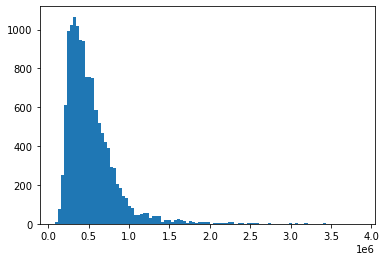

In [16]:
plt.hist(df['price'], bins=100);

C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


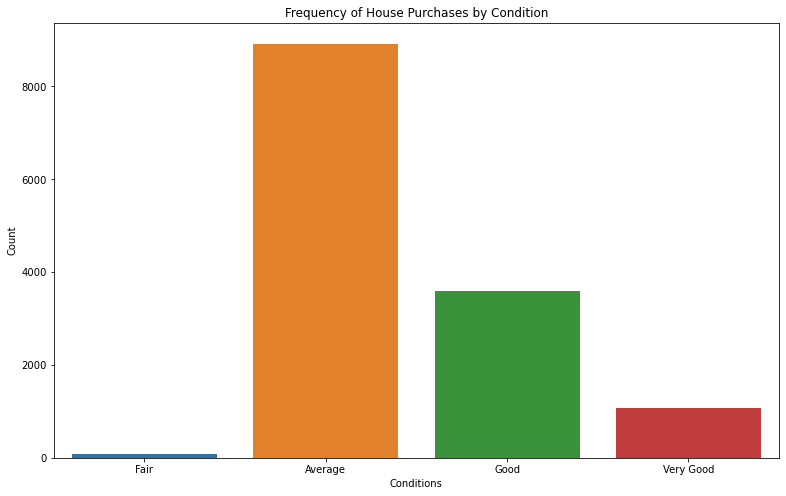

In [17]:
plt.figure(figsize=(13,8))

cond_group = df.groupby(by=["condition_num"])
cond_freq = cond_group.size()
cond_freq_plot = sns.barplot(cond_freq.index, cond_freq.values)
cond_freq_plot.set(xlabel="Conditions", ylabel="Count", title="Frequency of House Purchases by Condition")
cond_freq_plot.set_xticklabels(['Fair', 'Average', 'Good', 'Very Good'])
plt.show();

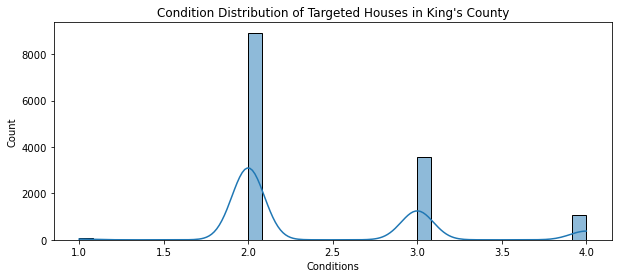

In [18]:
plt.figure(figsize=(10,4))

cond_dist = sns.histplot(df["condition_num"], kde=True)
cond_dist.set(xlabel="Conditions", title="Condition Distribution of Targeted Houses in King's County")

plt.show()

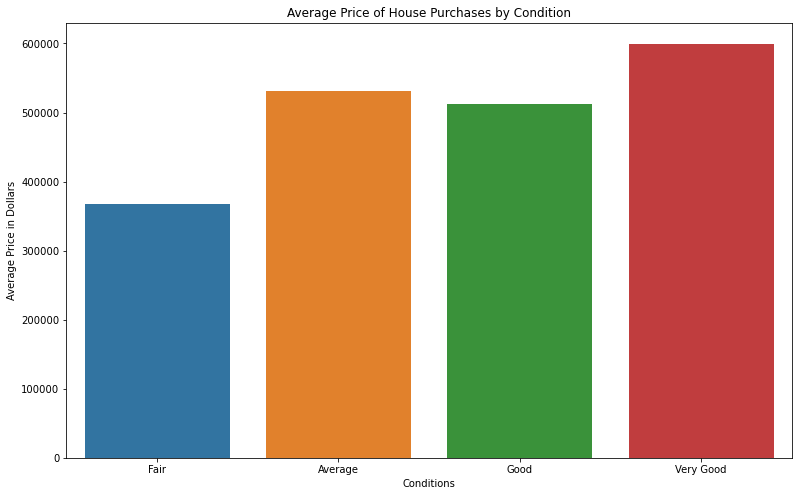

In [19]:
plt.figure(figsize=(13,8))

cond_price = cond_group["price"].mean()
cond_avg_price_plot = sns.barplot(x=cond_price.index, y=cond_price.values)
cond_avg_price_plot.set(xlabel="Conditions", ylabel="Average Price in Dollars", title="Average Price of House Purchases by Condition")
cond_avg_price_plot.set_xticklabels(['Fair', 'Average', 'Good', 'Very Good'])
plt.show()

C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


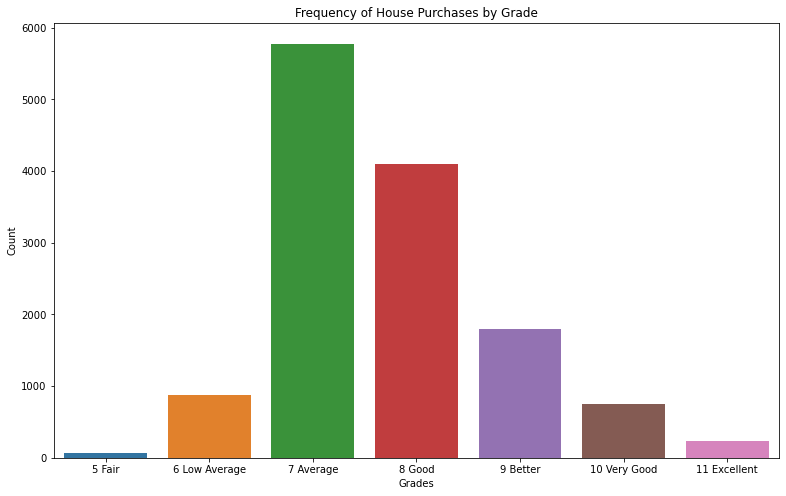

In [18]:
plt.figure(figsize=(13,8))

grade_group = df.groupby(by=["grade_value"])
grade_freq = grade_group.size()
grade_freq_plot = sns.barplot(grade_freq.index, grade_freq.values)
grade_freq_plot.set(xlabel="Grades", ylabel="Count", title="Frequency of House Purchases by Grade")
grade_freq_plot.set_xticklabels(['5 Fair', '6 Low Average', '7 Average', '8 Good', '9 Better', '10 Very Good', '11 Excellent'])
plt.show();

<ipython-input-194-cda4c615f9de>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['Fair', 'Low Average', 'Average', 'Good', 'Better', 'Very Good', 'Excellent'], fontsize=15)


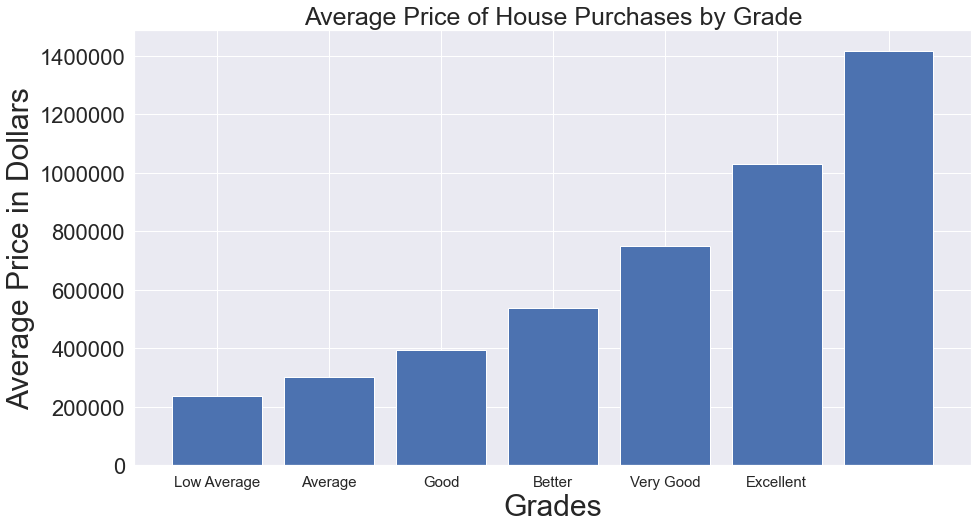

In [194]:
fig, ax = plt.subplots(figsize=(15,8))

grade_price = grade_group["price"].mean()
ax.bar(grade_price.index, grade_price.values)
ax.ticklabel_format(style='plain')
ax.set_title("Average Price of House Purchases by Grade", fontsize=25)
ax.set_xlabel("Grades", fontsize=30)
ax.set_ylabel("Average Price in Dollars", fontsize=30)
ax.set_xticklabels(['Fair', 'Low Average', 'Average', 'Good', 'Better', 'Very Good', 'Excellent'], fontsize=15)
plt.show();

In [20]:
target_df = df[df['grade_value'] <= 9]
target_df

,id,date,price,bedrooms,bathrooms,sqft_living,floors,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,grade_value,age,condition_num
0,7129300520,2014-10-13,221900.0,3,1.00,1180,1.0,Average,7 Average,1180,1955,0.0,98178,47.5112,-122.257,1340,7,60.0,2
1,6414100192,2014-12-09,538000.0,3,2.25,2570,2.0,Average,7 Average,2170,1951,1991.0,98125,47.7210,-122.319,1690,7,24.0,2
3,2487200875,2014-12-09,604000.0,4,3.00,1960,1.0,Very Good,7 Average,1050,1965,0.0,98136,47.5208,-122.393,1360,7,50.0,4
4,1954400510,2015-02-18,510000.0,3,2.00,1680,1.0,Average,8 Good,1680,1987,0.0,98074,47.6168,-122.045,1800,8,28.0,2
6,1321400060,2014-06-27,257500.0,3,2.25,1715,2.0,Average,7 Average,1715,1995,0.0,98003,47.3097,-122.327,2238,7,20.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21590,7936000429,2015-03-26,1010000.0,4,3.50,3510,2.0,Average,9 Better,2600,2009,0.0,98136,47.5537,-122.398,2050,9,6.0,2
21591,2997800021,2015-02-19,475000.0,3,2.50,1310,2.0,Average,8 Good,1180,2008,0.0,98116,47.5773,-122.409,1330,8,7.0,2
21592,263000018,2014-05-21,360000.0,3,2.50,1530,3.0,Average,8 Good,1530,2009,0.0,98103,47.6993,-122.346,1530,8,6.0,2
21593,6600060120,2015-02-23,400000.0,4,2.50,2310,2.0,Average,8 Good,2310,2014,0.0,98146,47.5107,-122.362,1830,8,1.0,2


In [23]:
df['grade'].replace((5, 6, 7, 8, 9, 10, 11), ('5 Fair', '6 Low Average', '7 Average', '8 Good', '9 Better', '10 Very Good', '11 Excellent'), inplace=True)

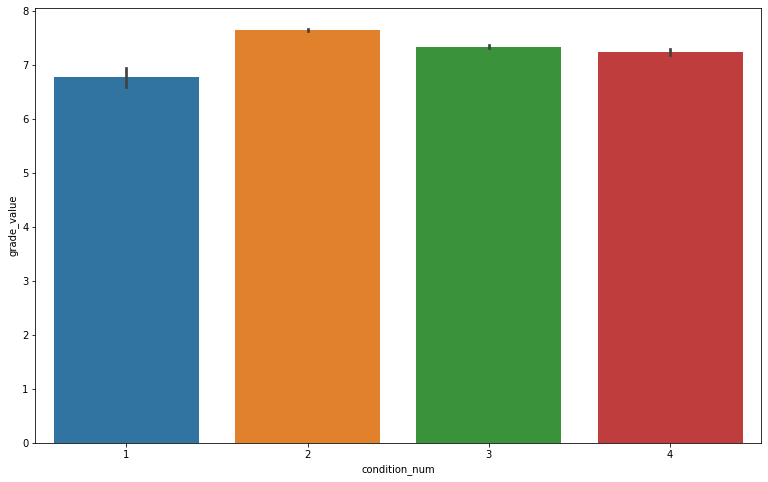

In [22]:
plt.figure(figsize=(13,8))

sns.barplot(x=target_df['condition_num'], y=target_df['grade_value'])
plt.show();

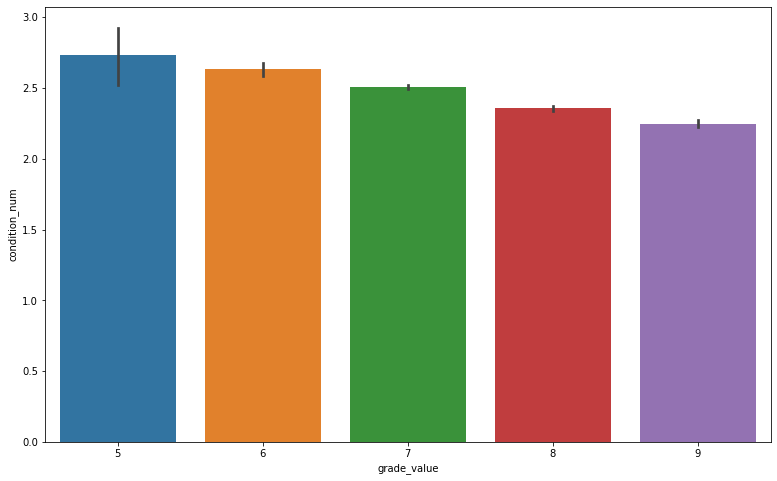

In [23]:
plt.figure(figsize=(13,8))

sns.barplot(x=target_df['grade_value'], y=target_df['condition_num'])
plt.show();

In [26]:
target_df['grade_value'].corr(target_df['condition_num'])

-0.21737208405802344

In [68]:
three_bed_homes = target_df[target_df['bedrooms'] == 3]
three_bed_homes

,id,date,price,bedrooms,bathrooms,sqft_living,floors,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,grade_value,age,condition_num
0,7129300520,2014-10-13,221900.0,3,1.00,1180,1.0,Average,7 Average,1180,1955,0.0,98178,47.5112,-122.257,1340,7,60.0,2
1,6414100192,2014-12-09,538000.0,3,2.25,2570,2.0,Average,7 Average,2170,1951,1991.0,98125,47.7210,-122.319,1690,7,24.0,2
4,1954400510,2015-02-18,510000.0,3,2.00,1680,1.0,Average,8 Good,1680,1987,0.0,98074,47.6168,-122.045,1800,8,28.0,2
6,1321400060,2014-06-27,257500.0,3,2.25,1715,2.0,Average,7 Average,1715,1995,0.0,98003,47.3097,-122.327,2238,7,20.0,2
7,2008000270,2015-01-15,291850.0,3,1.50,1060,1.0,Average,7 Average,1060,1963,0.0,98198,47.4095,-122.315,1650,7,52.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21587,7852140040,2014-08-25,507250.0,3,2.50,2270,2.0,Average,8 Good,2270,2003,0.0,98065,47.5389,-121.881,2270,8,12.0,2
21588,9834201367,2015-01-26,429000.0,3,2.00,1490,3.0,Average,8 Good,1490,2014,0.0,98144,47.5699,-122.288,1400,8,1.0,2
21591,2997800021,2015-02-19,475000.0,3,2.50,1310,2.0,Average,8 Good,1180,2008,0.0,98116,47.5773,-122.409,1330,8,7.0,2
21592,263000018,2014-05-21,360000.0,3,2.50,1530,3.0,Average,8 Good,1530,2009,0.0,98103,47.6993,-122.346,1530,8,6.0,2


In [69]:
three_bed_homes = three_bed_homes[three_bed_homes['price'] <= 605000]
three_bed_homes

,id,date,price,bedrooms,bathrooms,sqft_living,floors,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,grade_value,age,condition_num
0,7129300520,2014-10-13,221900.0,3,1.00,1180,1.0,Average,7 Average,1180,1955,0.0,98178,47.5112,-122.257,1340,7,60.0,2
1,6414100192,2014-12-09,538000.0,3,2.25,2570,2.0,Average,7 Average,2170,1951,1991.0,98125,47.7210,-122.319,1690,7,24.0,2
4,1954400510,2015-02-18,510000.0,3,2.00,1680,1.0,Average,8 Good,1680,1987,0.0,98074,47.6168,-122.045,1800,8,28.0,2
6,1321400060,2014-06-27,257500.0,3,2.25,1715,2.0,Average,7 Average,1715,1995,0.0,98003,47.3097,-122.327,2238,7,20.0,2
7,2008000270,2015-01-15,291850.0,3,1.50,1060,1.0,Average,7 Average,1060,1963,0.0,98198,47.4095,-122.315,1650,7,52.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21587,7852140040,2014-08-25,507250.0,3,2.50,2270,2.0,Average,8 Good,2270,2003,0.0,98065,47.5389,-121.881,2270,8,12.0,2
21588,9834201367,2015-01-26,429000.0,3,2.00,1490,3.0,Average,8 Good,1490,2014,0.0,98144,47.5699,-122.288,1400,8,1.0,2
21591,2997800021,2015-02-19,475000.0,3,2.50,1310,2.0,Average,8 Good,1180,2008,0.0,98116,47.5773,-122.409,1330,8,7.0,2
21592,263000018,2014-05-21,360000.0,3,2.50,1530,3.0,Average,8 Good,1530,2009,0.0,98103,47.6993,-122.346,1530,8,6.0,2


In [70]:
four_bed_homes = target_df[target_df['bedrooms'] == 4]
four_bed_homes

,id,date,price,bedrooms,bathrooms,sqft_living,floors,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,grade_value,age,condition_num
3,2487200875,2014-12-09,604000.0,4,3.00,1960,1.0,Very Good,7 Average,1050,1965,0.0,98136,47.5208,-122.393,1360,7,50.0,4
15,9297300055,2015-01-24,650000.0,4,3.00,2950,2.0,Average,9 Better,1980,1979,0.0,98126,47.5714,-122.375,2140,9,36.0,2
17,6865200140,2014-05-29,485000.0,4,1.00,1600,1.5,Good,7 Average,1600,1916,0.0,98103,47.6648,-122.343,1610,7,99.0,3
20,6300500875,2014-05-14,385000.0,4,1.75,1620,1.0,Good,7 Average,860,1947,0.0,98133,47.7025,-122.341,1400,7,68.0,3
29,1873100390,2015-03-02,719000.0,4,2.50,2570,2.0,Average,8 Good,2570,2005,0.0,98052,47.7073,-122.110,2630,8,10.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21578,5087900040,2014-10-17,350000.0,4,2.75,2500,2.0,Average,8 Good,2500,2008,0.0,98042,47.3749,-122.107,2530,8,7.0,2
21582,8956200760,2014-10-13,541800.0,4,2.50,3118,2.0,Average,9 Better,3118,2014,0.0,98001,47.2931,-122.264,2673,9,1.0,2
21589,3448900210,2014-10-14,610685.0,4,2.50,2520,2.0,Average,9 Better,2520,2014,0.0,98056,47.5137,-122.167,2520,9,1.0,2
21590,7936000429,2015-03-26,1010000.0,4,3.50,3510,2.0,Average,9 Better,2600,2009,0.0,98136,47.5537,-122.398,2050,9,6.0,2


In [71]:
four_bed_homes = four_bed_homes[four_bed_homes['price'] <= 730000]
four_bed_homes

,id,date,price,bedrooms,bathrooms,sqft_living,floors,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,grade_value,age,condition_num
3,2487200875,2014-12-09,604000.0,4,3.00,1960,1.0,Very Good,7 Average,1050,1965,0.0,98136,47.5208,-122.393,1360,7,50.0,4
15,9297300055,2015-01-24,650000.0,4,3.00,2950,2.0,Average,9 Better,1980,1979,0.0,98126,47.5714,-122.375,2140,9,36.0,2
17,6865200140,2014-05-29,485000.0,4,1.00,1600,1.5,Good,7 Average,1600,1916,0.0,98103,47.6648,-122.343,1610,7,99.0,3
20,6300500875,2014-05-14,385000.0,4,1.75,1620,1.0,Good,7 Average,860,1947,0.0,98133,47.7025,-122.341,1400,7,68.0,3
29,1873100390,2015-03-02,719000.0,4,2.50,2570,2.0,Average,8 Good,2570,2005,0.0,98052,47.7073,-122.110,2630,8,10.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21561,3881900317,2015-01-23,579000.0,4,3.25,1900,2.0,Average,9 Better,1250,2014,0.0,98144,47.5869,-122.311,1710,9,1.0,2
21578,5087900040,2014-10-17,350000.0,4,2.75,2500,2.0,Average,8 Good,2500,2008,0.0,98042,47.3749,-122.107,2530,8,7.0,2
21582,8956200760,2014-10-13,541800.0,4,2.50,3118,2.0,Average,9 Better,3118,2014,0.0,98001,47.2931,-122.264,2673,9,1.0,2
21589,3448900210,2014-10-14,610685.0,4,2.50,2520,2.0,Average,9 Better,2520,2014,0.0,98056,47.5137,-122.167,2520,9,1.0,2


In [72]:
colormap = cm.LinearColormap(colors=['blue', 'green', 'yellow'], vmin=0, vmax=730000)
four_bed_homes_map = folium.Map(location=[47.560093, -122.213982], zoom_start=10)

# go through each home in set, make circle, and add to map.
for i in range(len(four_bed_homes)):
    folium.Circle(
        location=[four_bed_homes.iloc[i]['lat'], four_bed_homes.iloc[i]['long']],
        radius=10,
        fill_opacity=0.05,
        fill=True,
        color=colormap(four_bed_homes.iloc[i]['price']),
    ).add_to(four_bed_homes_map)
four_bed_homes_map.add_child(colormap)
# Same as before, we save it to file
four_bed_homes_map.save('circle_map.html')

In [67]:
four_bed_homes_map

In [92]:
colormap = cm.LinearColormap(colors=['blue', 'green', 'yellow'], vmin=0, vmax=605000)
three_bed_homes_map = folium.Map(location=[47.560093, -122.213982], zoom_start=10)

# go through each home in set, make circle, and add to map.
for i in range(len(three_bed_homes)):
    folium.Circle(
        location=[three_bed_homes.iloc[i]['lat'], three_bed_homes.iloc[i]['long']],
        radius=10,
        fill=True,
        color=colormap(three_bed_homes.iloc[i]['price']),
        fill_opacity=0.2,
    ).add_to(three_bed_homes_map)
three_bed_homes_map.add_child(colormap)
# Same as before, we save it to file
three_bed_homes_map.save('circle_map.html')

In [132]:
three_bed_homes_map

NameError: name 'three_bed_homes_map' is not defined

In [73]:
three_bed_homes['zipcode'] = three_bed_homes['zipcode'].astype('str')
three_zipcode_data = three_bed_homes.groupby('zipcode').aggregate(np.mean)
three_zipcode_data.reset_index(inplace = True)

<ipython-input-73-cf8f7548d7d1>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  three_bed_homes['zipcode'] = three_bed_homes['zipcode'].astype('str')


In [74]:
three_zipcode_data

,zipcode,id,price,bedrooms,bathrooms,sqft_living,floors,sqft_above,yr_built,yr_renovated,lat,long,sqft_living15,grade_value,age,condition_num
0,98001,4.716474e+09,250124.835616,3.0,1.820205,1638.842466,1.267123,1505.773973,1977.232877,27.034247,47.307929,-122.271048,1713.958904,7.095890,37.178082,2.404110
1,98002,5.189226e+09,223863.861702,3.0,1.638298,1417.021277,1.319149,1385.744681,1969.372340,42.127660,47.309207,-122.212277,1415.489362,6.648936,44.287234,2.712766
2,98003,4.700581e+09,259329.517730,3.0,1.874113,1618.007092,1.241135,1480.702128,1975.780142,0.000000,47.315640,-122.309333,1697.219858,7.290780,39.219858,2.397163
3,98004,7.000101e+09,600000.000000,3.0,1.000000,940.000000,1.000000,940.000000,1945.000000,0.000000,47.582800,-122.190000,2280.000000,6.000000,70.000000,2.000000
4,98005,5.051762e+09,542901.235294,3.0,1.897059,1670.000000,1.058824,1387.647059,1965.176471,0.000000,47.595400,-122.170824,1938.235294,7.411765,49.823529,2.529412
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,98177,4.153300e+09,426525.583333,3.0,1.712500,1694.666667,1.233333,1450.033333,1960.366667,132.316667,47.747123,-122.366167,1820.666667,7.383333,52.650000,2.383333
65,98178,4.116514e+09,271362.469136,3.0,1.632716,1546.419753,1.104938,1214.567901,1952.259259,74.197531,47.499500,-122.249988,1577.407407,6.691358,59.888889,2.382716
66,98188,4.118551e+09,256853.510638,3.0,1.585106,1575.957447,1.148936,1376.595745,1963.021277,126.723404,47.445594,-122.281234,1614.595745,7.021277,49.531915,2.234043
67,98198,5.405585e+09,281513.073394,3.0,1.665138,1605.688073,1.183486,1383.761468,1966.412844,54.807339,47.393030,-122.315954,1644.908257,7.009174,47.045872,2.376147


In [95]:
# count number of houses grouped by zipcode
three_bed_homes['count'] = 1
temp = three_bed_homes.groupby('zipcode').sum()
temp.reset_index(inplace = True)
temp = temp[['zipcode', 'count']]
three_zipcode_data = pd.merge(three_zipcode_data, temp, on='zipcode')
# drop count from org dataset
three_bed_homes.drop(['count'], axis = 1, inplace = True)

<ipython-input-95-09ac7f4f6804>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  three_bed_homes['count'] = 1
C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [96]:
boundary_file = "data/Zipcodes_for_King_County_and_Surrounding_Area__Shorelines____zipcode_shore_area.geojson"
with open(boundary_file, 'r') as f:
    geo_data = json.load(f)
    
tmp = geo_data
# remove ZIP codes not in geo data
geozips = []
for i in range(len(tmp['features'])):
    if tmp['features'][i]['properties']['ZIPCODE'] in list(three_zipcode_data['zipcode'].unique()):
        geozips.append(tmp['features'][i])
# creating new JSON object
new_json = dict.fromkeys(['type','features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geozips
# save uodated JSON object
open("cleaned_geodata.json", "w").write(json.dumps(new_json, sort_keys=True, indent=4, separators=(',', ': ')))

14807801

In [122]:
def map_feature_by_zipcode(zipcode_data, col):
    """
    Generates a folium map of Seattle
    :param zipcode_data: zipcode dataset
    :param col: feature to display
    :return: m
    """

    # read updated geo data
    king_geo = "cleaned_geodata.json"

    # Initialize Folium Map with Seattle latitude and longitude
    m = folium.Map(location=[47.35, -121.9], zoom_start=9.4,
                   detect_retina=True, control_scale=False, tiles='OpenStreetMap')

    # Create choropleth map
    m.choropleth(
        geo_data=king_geo,
        name='choropleth',
        data=zipcode_data,
        # col: feature of interest
        columns=['zipcode', col],
        key_on='feature.properties.ZIPCODE',
        fill_color='YlGnBu',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name='House ' + col.title()
    )
    folium.LayerControl().add_to(m)

    # Save map based on feature of interest
    m.save(col + '.html')

    return m

In [123]:
map_feature_by_zipcode(three_zipcode_data, 'price')

In [101]:
four_bed_homes['zipcode'] = four_bed_homes['zipcode'].astype('str')
# get the mean value across all data points
four_zipcode_data = four_bed_homes.groupby('zipcode').aggregate(np.mean)
four_zipcode_data.reset_index(inplace = True)

<ipython-input-101-6db88f6f7d54>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  four_bed_homes['zipcode'] = four_bed_homes['zipcode'].astype('str')


In [102]:
four_zipcode_data

,zipcode,id,price,bedrooms,bathrooms,sqft_living,floors,sqft_above,yr_built,yr_renovated,lat,long,sqft_living15,grade_value,age,condition_num
0,98001,4.749594e+09,313829.568627,4.0,2.360294,2209.656863,1.676471,2004.754902,1991.882353,0.000000,47.312642,-122.269029,1998.725490,7.578431,23.117647,2.137255
1,98002,4.942990e+09,263588.658537,4.0,2.225610,2008.926829,1.439024,1765.121951,1976.902439,145.731707,47.311159,-122.212293,1674.731707,6.975610,35.585366,2.585366
2,98003,4.630242e+09,326436.271186,4.0,2.271186,2291.355932,1.440678,1869.135593,1981.745763,0.000000,47.314749,-122.310220,2160.033898,7.762712,33.254237,2.288136
3,98004,4.480782e+09,606428.571429,4.0,2.000000,1758.571429,1.142857,1392.857143,1960.000000,0.000000,47.608386,-122.193143,2170.000000,7.428571,55.000000,2.428571
4,98005,5.282847e+09,636433.272727,4.0,2.170455,2242.272727,1.181818,1788.181818,1966.863636,0.000000,47.600268,-122.165909,2333.181818,8.090909,48.136364,2.590909
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,98177,3.650546e+09,553214.285714,4.0,2.232143,2296.904762,1.333333,1759.285714,1964.880952,0.000000,47.746633,-122.368405,2060.952381,7.690476,50.119048,2.547619
65,98178,4.235875e+09,320323.181818,4.0,1.909091,1982.545455,1.236364,1400.545455,1959.163636,73.127273,47.499591,-122.246455,1748.181818,7.000000,53.690909,2.345455
66,98188,4.938045e+09,323396.972222,4.0,2.173611,2167.222222,1.402778,1744.166667,1971.277778,0.000000,47.447314,-122.280417,1755.000000,7.194444,43.722222,2.250000
67,98198,6.385151e+09,303612.586207,4.0,2.056034,1929.827586,1.310345,1607.068966,1969.224138,103.051724,47.388222,-122.314448,1754.362069,7.206897,42.568966,2.431034


In [103]:
# count number of houses grouped by zipcode
four_bed_homes['count'] = 1
temp = four_bed_homes.groupby('zipcode').sum()
temp.reset_index(inplace = True)
temp = temp[['zipcode', 'count']]
four_zipcode_data = pd.merge(four_zipcode_data, temp, on='zipcode')
# drop count from org dataset
four_bed_homes.drop(['count'], axis = 1, inplace = True)

<ipython-input-103-2db2d5d9626d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  four_bed_homes['count'] = 1
C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [104]:
boundary_file = "data/Zipcodes_for_King_County_and_Surrounding_Area__Shorelines____zipcode_shore_area.geojson"
with open(boundary_file, 'r') as f:
    geo_data = json.load(f)
    
tmp = geo_data
# remove ZIP codes not in geo data
geozips = []
for i in range(len(tmp['features'])):
    if tmp['features'][i]['properties']['ZIPCODE'] in list(four_zipcode_data['zipcode'].unique()):
        geozips.append(tmp['features'][i])
# creating new JSON object
new_json = dict.fromkeys(['type','features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geozips
# save uodated JSON object
open("cleaned_geodata.json", "w").write(json.dumps(new_json, sort_keys=True, indent=4, separators=(',', ': ')))

14807801

In [124]:
def map_feature_by_zipcode(zipcode_data, col):
    """
    Generates a folium map of Seattle
    :param zipcode_data: zipcode dataset
    :param col: feature to display
    :return: m
    """

    # read updated geo data
    king_geo = "cleaned_geodata.json"

    # Initialize Folium Map with Seattle latitude and longitude
    m = folium.Map(location=[47.35, -121.9], zoom_start=9.45,
                   detect_retina=True, control_scale=False, tiles='OpenStreetMap')

    # Create choropleth map
    m.choropleth(
        geo_data=king_geo,
        name='choropleth',
        data=zipcode_data,
        # col: feature of interest
        columns=['zipcode', col],
        key_on='feature.properties.ZIPCODE',
        fill_color='YlGnBu',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name='House ' + col.title()
    )
    folium.LayerControl().add_to(m)

    # Save map based on feature of interest
    m.save(col + '.html')

    return m

In [126]:
map_feature_by_zipcode(four_zipcode_data, 'price')